In [3]:
import pandas as pd
from IPython.display import Image
from google.cloud import vision

# Detecting labels using Vision

This notebooks shows how you can use the Google Cloud Vision API to add content labels to images.

We'll use the Google Cloud Client Library for Vision to perform label detection on some cute animal pictures.

## What does vision think of my cat, Tillie?

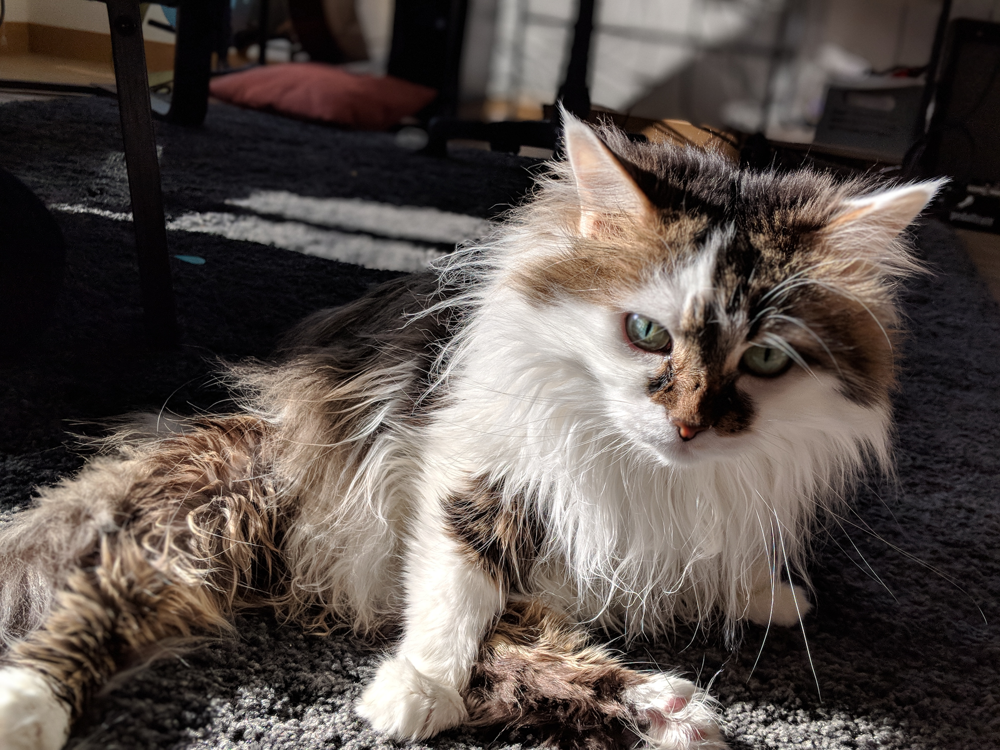

In [4]:
cat_picture = open('data/cat.jpg', 'rb').read()

# Display our cat picture
Image(cat_picture, width=800)

In [5]:
client = vision.ImageAnnotatorClient()

In [6]:
response = client.label_detection(image=vision.types.Image(content=cat_picture))
response

label_annotations {
  mid: "/m/01yrx"
  description: "cat"
  score: 0.9925948977470398
  topicality: 0.9925948977470398
}
label_annotations {
  mid: "/m/07k6w8"
  description: "small to medium sized cats"
  score: 0.9168239235877991
  topicality: 0.9168239235877991
}
label_annotations {
  mid: "/m/01l7qd"
  description: "whiskers"
  score: 0.9051872491836548
  topicality: 0.9051872491836548
}
label_annotations {
  mid: "/m/0307l"
  description: "cat like mammal"
  score: 0.8629337549209595
  topicality: 0.8629337549209595
}
label_annotations {
  mid: "/m/035qhg"
  description: "fauna"
  score: 0.8494744300842285
  topicality: 0.8494744300842285
}
label_annotations {
  mid: "/m/0cnmr"
  description: "fur"
  score: 0.7977433204650879
  topicality: 0.7977433204650879
}
label_annotations {
  mid: "/m/014sv8"
  description: "eye"
  score: 0.7579811811447144
  topicality: 0.7579811811447144
}
label_annotations {
  mid: "/m/017fsk"
  description: "norwegian forest cat"
  score: 0.615016162395

### Slightly more readable

Let's us jupyter's features to make this raw data a bit more readable:

In [7]:
def print_labels(response):
    labels = [(label.description, label.score) for label in response.label_annotations]
    return pd.DataFrame(labels, columns=['label', 'score'])

In [8]:
print_labels(response)

,label,score
0,cat,0.992595
1,small to medium sized cats,0.916824
2,whiskers,0.905187
3,cat like mammal,0.862934
4,fauna,0.849474
5,fur,0.797743
6,eye,0.757981
7,norwegian forest cat,0.615016
8,snout,0.584756
9,domestic short haired cat,0.581839


## What does Vision think about this wonderful goat that lives at Carmel Valley Ranch?

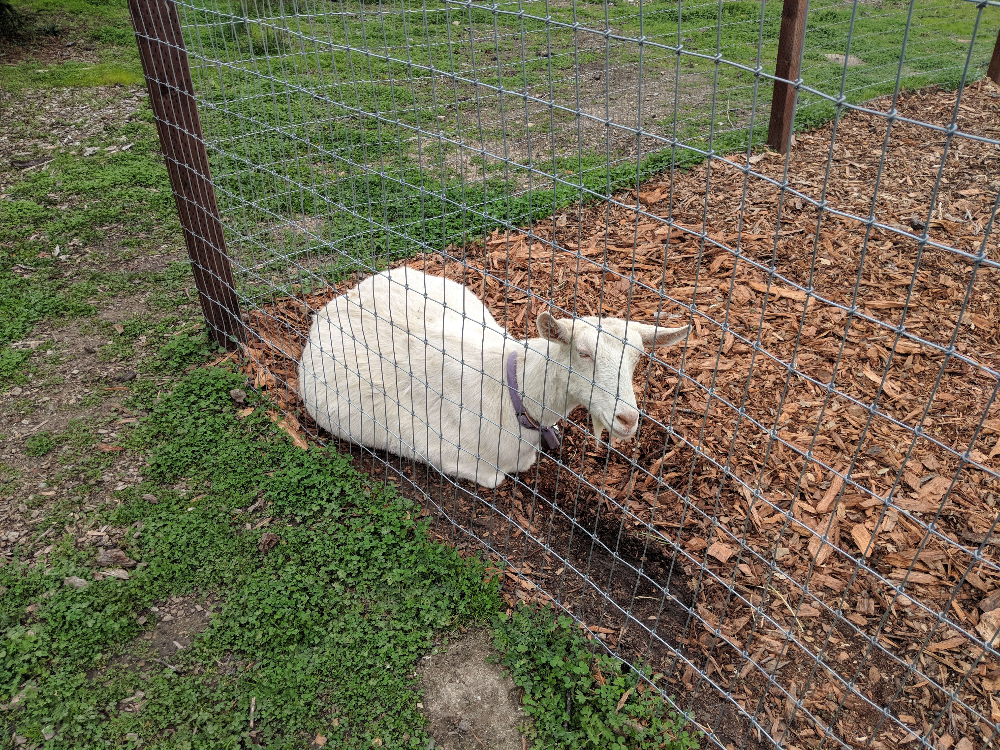

In [9]:
goat_picture = open('data/goat.jpg', 'rb').read()

# Display our goat picture
Image(goat_picture, width=800)

In [10]:
response = client.label_detection(image=vision.types.Image(content=goat_picture))
print_labels(response)

,label,score
0,fauna,0.872978
1,grass,0.803558
2,fence,0.688849
3,pasture,0.665725
4,wood,0.654089
5,soil,0.652759
6,goats,0.638318
7,zoo,0.606419
8,grass family,0.592606
9,outdoor structure,0.579555


## Okay, but how about something that isn't an animal?

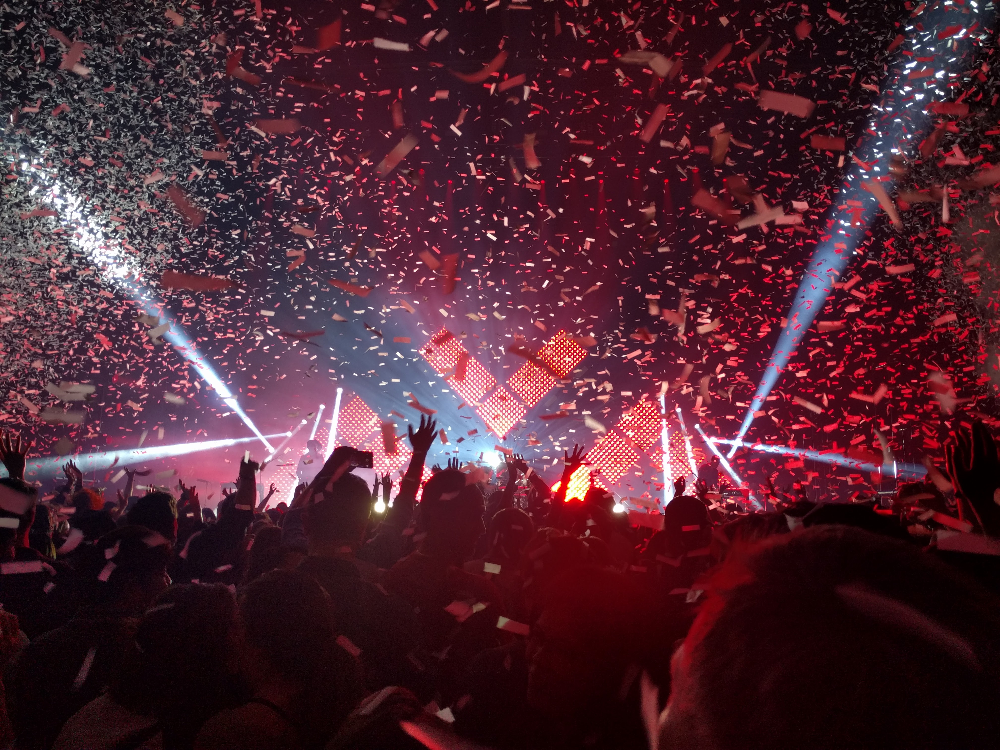

In [11]:
concert_picture = open('data/concert.jpg', 'rb').read()

# Display our concert picture
Image(concert_picture, width=800)

In [12]:
response = client.label_detection(image=vision.types.Image(content=concert_picture))
print_labels(response)

,label,score
0,entertainment,0.961816
1,red,0.955836
2,crowd,0.929638
3,concert,0.855488
4,event,0.837060
5,light,0.836773
6,festival,0.793692
7,stage,0.781419
8,fête,0.744831
9,audience,0.735488
